# Credit Risk Classification

Credit risk poses a classification problem that’s inherently imbalanced. This is because healthy loans easily outnumber risky loans. In this Challenge, you’ll use various techniques to train and evaluate models with imbalanced classes. You’ll use a dataset of historical lending activity from a peer-to-peer lending services company to build a model that can identify the creditworthiness of borrowers.

## Instructions:

This challenge consists of the following subsections:

* Split the Data into Training and Testing Sets

* Create a Logistic Regression Model with the Original Data

* Predict a Logistic Regression Model with Resampled Training Data 

### Split the Data into Training and Testing Sets

Open the starter code notebook and then use it to complete the following steps.

1. Read the `lending_data.csv` data from the `Resources` folder into a Pandas DataFrame.

2. Create the labels set (`y`)  from the “loan_status” column, and then create the features (`X`) DataFrame from the remaining columns.

    > **Note** A value of `0` in the “loan_status” column means that the loan is healthy. A value of `1` means that the loan has a high risk of defaulting.  

3. Check the balance of the labels variable (`y`) by using the `value_counts` function.

4. Split the data into training and testing datasets by using `train_test_split`.

### Create a Logistic Regression Model with the Original Data

Employ your knowledge of logistic regression to complete the following steps:

1. Fit a logistic regression model by using the training data (`X_train` and `y_train`).

2. Save the predictions on the testing data labels by using the testing feature data (`X_test`) and the fitted model.

3. Evaluate the model’s performance by doing the following:

    * Calculate the accuracy score of the model.

    * Generate a confusion matrix.

    * Print the classification report.

4. Answer the following question: How well does the logistic regression model predict both the `0` (healthy loan) and `1` (high-risk loan) labels?

### Predict a Logistic Regression Model with Resampled Training Data

Did you notice the small number of high-risk loan labels? Perhaps, a model that uses resampled data will perform better. You’ll thus resample the training data and then reevaluate the model. Specifically, you’ll use `RandomOverSampler`.

To do so, complete the following steps:

1. Use the `RandomOverSampler` module from the imbalanced-learn library to resample the data. Be sure to confirm that the labels have an equal number of data points. 

2. Use the `LogisticRegression` classifier and the resampled data to fit the model and make predictions.

3. Evaluate the model’s performance by doing the following:

    * Calculate the accuracy score of the model.

    * Generate a confusion matrix.

    * Print the classification report.
    
4. Answer the following question: How well does the logistic regression model, fit with oversampled data, predict both the `0` (healthy loan) and `1` (high-risk loan) labels?

### Write a Credit Risk Analysis Report

For this section, you’ll write a brief report that includes a summary and an analysis of the performance of both machine learning models that you used in this challenge. You should write this report as the `README.md` file included in your GitHub repository.

Structure your report by using the report template that `Starter_Code.zip` includes, and make sure that it contains the following:

1. An overview of the analysis: Explain the purpose of this analysis.


2. The results: Using bulleted lists, describe the balanced accuracy scores and the precision and recall scores of both machine learning models.

3. A summary: Summarize the results from the machine learning models. Compare the two versions of the dataset predictions. Include your recommendation for the model to use, if any, on the original vs. the resampled data. If you don’t recommend either model, justify your reasoning.

In [1]:
# Import the modules
import sys
import platform

import numpy as np
import pandas as pd
from pandas import read_csv as rcsv
import sklearn as sk
from pathlib import Path

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import mean_absolute_error

from imblearn.metrics import classification_report_imbalanced
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTEENN
from sklearn.ensemble import RandomForestClassifier

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier, NearestNeighbors, kneighbors_graph

import hvplot.pandas
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Report Technologies
print(f'Python Platform: {platform.platform()}')
print(f'Python {sys.version}')
print()
print(f'Pandas {pd.__version__}')
print(f'Numpy {np.__version__}')
print(f'Scikit-Learn {sk.__version__}')
print(f'Seaborn {sns.__version__}')

Python Platform: macOS-13.0.1-arm64-arm-64bit
Python 3.9.15 | packaged by conda-forge | (main, Nov 22 2022, 08:52:10) 
[Clang 14.0.6 ]

Pandas 1.5.1
Numpy 1.21.5
Scikit-Learn 1.1.3
Seaborn 0.12.0


---

# Supplemental Initial Data Exploration
###### for Official Mod12 Challenge, scroll down to section 'Formal Module 12 Challenge Begins Below'

### Read the supplemental_lending_data.csv data from the Resources folder into a Pandas DataFrame.

In [3]:
# Read the CSV file from the Resources folder into a Pandas DataFrame
supp_lend_df = rcsv(
    Path('./Resources/supplemental_lending_data.csv')
)

# confirm 'keys' and review the DataFrame
display(supp_lend_df.columns)
print('\n')
display(supp_lend_df.shape)
print('\n')
display(supp_lend_df.info())
print('\n')
display(supp_lend_df.head(3))

Index(['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income',
       'num_of_accounts', 'derogatory_marks', 'total_debt', 'loan_status'],
      dtype='object')

(77536, 8)



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77536 entries, 0 to 77535
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   loan_size         77536 non-null  float64
 1   interest_rate     77536 non-null  float64
 2   borrower_income   77536 non-null  int64  
 3   debt_to_income    77536 non-null  float64
 4   num_of_accounts   77536 non-null  int64  
 5   derogatory_marks  77536 non-null  int64  
 6   total_debt        77536 non-null  int64  
 7   loan_status       77536 non-null  int64  
dtypes: float64(3), int64(5)
memory usage: 4.7 MB


None

,loan_size,interest_rate,borrower_income,debt_to_income,num_of_accounts,derogatory_marks,total_debt,loan_status
0,10700.0,7.672,52800,0.431818,5,1,22800,0
1,8400.0,6.692,43600,0.311927,3,0,13600,0
2,9000.0,6.963,46100,0.349241,3,0,16100,0


In [4]:
# Count how many targets category
supp_lend_df['loan_status'].value_counts()

0    75036
1     2500
Name: loan_status, dtype: int64

### Create the labels set (y1) from the “loan_status” column, and then create the features (X1) DataFrame from the remaining columns.

In [5]:
# Separate the data into labels and features

# Separate the y variable, the labels
y1 = supp_lend_df['loan_status']

# Separate the X variable, the features
X1 = supp_lend_df.drop(columns = 'loan_status')
# X = borrowers_df.drop('loan_status', axis=1)
# X = borrowers_df[['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income', 'num_of_accounts', 'derogatory_marks', 'total_debt']]

### Scale the features

In [6]:
# Scale features data values
supp_lend_scaled = StandardScaler().fit_transform(X1)

# Create a DataFrame with the scaled data
df_supp_lend_scaled = pd.DataFrame(
    supp_lend_scaled,
    columns=['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income', 'num_of_accounts', 'derogatory_marks', 'total_debt']
)

# confirm 'keys' and review the DataFrame
display(df_supp_lend_scaled.columns)
print('\n')
display(df_supp_lend_scaled.head(3))

Index(['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income',
       'num_of_accounts', 'derogatory_marks', 'total_debt'],
      dtype='object')

,loan_size,interest_rate,borrower_income,debt_to_income,num_of_accounts,derogatory_marks,total_debt
0,0.427304,0.426837,0.427404,0.668571,0.616143,1.043996,0.427404
1,-0.671487,-0.674918,-0.671552,-0.802166,-0.434049,-0.673973,-0.671552
2,-0.384846,-0.370249,-0.372922,-0.344424,-0.434049,-0.673973,-0.372922


### Reduce the number of features to two principal components by using PCA

In [7]:
# Create the PCA model instance where n_components=2
SEED = 42
pca = PCA(n_components=2, random_state = SEED)

In [8]:
# Fit the df_stocks_scaled data to the PCA
supp_lend_scaled_pca_data = pca.fit_transform(df_supp_lend_scaled)

# Review the first five rose of the PCA data
# using bracket notation ([0:5])
supp_lend_scaled_pca_data[0:5]

array([[ 1.50211599,  0.56907337],
       [-1.73535599, -0.11291934],
       [-1.10464078, -0.30999199],
       [ 1.48445546,  0.57455907],
       [ 1.5601859 ,  0.54981132]])

In [9]:
# Calculate the explained variance
pca.explained_variance_ratio_

array([0.94885897, 0.03734606])

### Using the PCA data calculated in the previous step, create a new DataFrame called df_supp_lend_scaled_pca

In [10]:
# Creating a DataFrame with the PCA data
df_supp_lend_scaled_pca = pd.DataFrame(
    supp_lend_scaled_pca_data,
    columns=['PC1', 'PC2']
)

### Combine the df_supp_lend_scaled_pca dataframe with loan_status series (y1)

In [11]:
# Concatenate the y1 series with the scaled data DataFrame
df_supp_lend_scaled_pca = pd.concat([df_supp_lend_scaled_pca, y1], axis=1)


### Run the K-means algorithm with the new principal-components data, and then create a scatter plot by using the two principal components for the x and y axes, and by using StockCluster. Be sure to style and format your plot.

In [12]:
# Initialize the K-Means model with n_clusters = 2
model_k2 = KMeans(n_clusters = 2, random_state = SEED)

# Fit the model for the df_stocks_pca DataFrame
model_k2.fit(df_supp_lend_scaled_pca)

KMeans(n_clusters=2, random_state=42)

In [13]:
# Predict the model segments (clusters)
lend_clusters_2 = model_k2.predict(df_supp_lend_scaled_pca)

# View the stock segments
print(lend_clusters_2)

[0 0 0 ... 1 1 1]


In [14]:
# Initialize the K-Means model with n_clusters = 2
model_k3 = KMeans(n_clusters = 3, random_state = SEED)

# Fit the model for the df_stocks_pca DataFrame
model_k3.fit(df_supp_lend_scaled_pca)

KMeans(n_clusters=3, random_state=42)

In [15]:
# Predict the model segments (clusters)
lend_clusters_3 = model_k3.predict(df_supp_lend_scaled_pca)

# View the stock segments
print(lend_clusters_3)

[0 2 2 ... 1 1 1]


In [16]:
# Create a copy of the df_stocks_pca DataFrame and name it as df_stocks_pca_predictions
df_supp_lend_scaled_pca_predictions = df_supp_lend_scaled_pca.copy()

# Create a new column in the DataFrame with the predicted clusters
df_supp_lend_scaled_pca_predictions['LendCluster'] = lend_clusters_2

# Review the DataFrame
display(df_supp_lend_scaled_pca_predictions.shape)
print('\n')
display(df_supp_lend_scaled_pca_predictions.sample(3))

(77536, 4)

,PC1,PC2,loan_status,LendCluster
11612,0.639554,0.887883,0,0
19200,-1.266403,-0.259858,0,0
25765,1.500813,0.569546,0,0


In [17]:
# identify 'keys', i.e. column names
sorted(df_supp_lend_scaled_pca_predictions)

['LendCluster', 'PC1', 'PC2', 'loan_status']

### Create Scatter Plot Visualization

In [18]:
# Create the scatter plot with x="PC1" and y="PC2"
df_supp_lend_scaled_pca_predictions.hvplot.scatter(
    x = 'PC1',
    y = 'PC2',
    by = 'LendCluster',
    # shape = 'loan_status',
    height=600, width=800,
    hover_cols = 'loan_status',
    hover_color = 'magenta',
    title = 'scaled loan data by 2 cluster'
)

:NdOverlay   [LendCluster]
   :Scatter   [PC1]   (PC2,loan_status)

In [19]:
# change cluster column in the DataFrame with the predicted 3 clusters
df_supp_lend_scaled_pca_predictions['LendCluster'] = lend_clusters_3

In [20]:
# Create the scatter plot with x="PC1" and y="PC2"
df_supp_lend_scaled_pca_predictions.hvplot.scatter(
    x = 'PC1',
    y = 'PC2',
    by = 'LendCluster',
    # shape = 'loan_status',
    height=600, width=800,
    hover_cols = 'loan_status',
    hover_color = 'magenta',
    title = 'scaled loan data by 3 cluster'
)

:NdOverlay   [LendCluster]
   :Scatter   [PC1]   (PC2,loan_status)

### Perform KN Regression (KNeighborsRegressor) analysis on the original data

In [21]:
# copy and save the original dataframe
new_supp_lend_df = supp_lend_df.copy()

In [22]:
# confirm 'keys' and review the DataFrame
display(new_supp_lend_df.columns)
print('\n')
display(new_supp_lend_df.shape)
print('\n')
display(new_supp_lend_df.info())
print('\n')
display(new_supp_lend_df.head(3))

Index(['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income',
       'num_of_accounts', 'derogatory_marks', 'total_debt', 'loan_status'],
      dtype='object')

(77536, 8)



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77536 entries, 0 to 77535
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   loan_size         77536 non-null  float64
 1   interest_rate     77536 non-null  float64
 2   borrower_income   77536 non-null  int64  
 3   debt_to_income    77536 non-null  float64
 4   num_of_accounts   77536 non-null  int64  
 5   derogatory_marks  77536 non-null  int64  
 6   total_debt        77536 non-null  int64  
 7   loan_status       77536 non-null  int64  
dtypes: float64(3), int64(5)
memory usage: 4.7 MB


None

,loan_size,interest_rate,borrower_income,debt_to_income,num_of_accounts,derogatory_marks,total_debt,loan_status
0,10700.0,7.672,52800,0.431818,5,1,22800,0
1,8400.0,6.692,43600,0.311927,3,0,13600,0
2,9000.0,6.963,46100,0.349241,3,0,16100,0


### Create the labels set (yn) from the “loan_status” column, and then create the features (Xn) DataFrame from the remaining columns.

In [23]:
# Separate the data into labels ('targets') and features

# Separate the y variable, the labels or 'targets'
yn = new_supp_lend_df['loan_status']

# Separate the X variable, the features
Xn = new_supp_lend_df.drop(columns = 'loan_status')
# X = borrowers_df.drop('loan_status', axis=1)
# X = borrowers_df[['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income', 'num_of_accounts', 'derogatory_marks', 'total_debt']]

### Split the original data into training and testing datasets by using train_test_split.

In [24]:
# Split the data using train_test_split
# Assign a random_state of 42 to the function

Xn_train, Xn_test, yn_train, yn_test = train_test_split(
    Xn, yn, 
    test_size=0.2,                # 80% train : 20% test split
    random_state = SEED
)

### Use describe method to evaluate the features from Xn, transpose.

In [25]:
# use describe and transpose
Xn.describe().T

,count,mean,std,min,25%,50%,75%,max
loan_size,77536.0,9805.562577,2093.223153,5000.00,8700.000000,9500.000000,10400.000000,23800.000000
interest_rate,77536.0,7.292333,0.889495,5.25,6.825000,7.172000,7.528000,13.235000
borrower_income,77536.0,49221.949804,8371.635077,30000.00,44800.000000,48100.000000,51400.000000,105200.000000
debt_to_income,77536.0,0.377318,0.081519,0.00,0.330357,0.376299,0.416342,0.714829
num_of_accounts,77536.0,3.826610,1.904426,0.00,3.000000,4.000000,4.000000,16.000000
derogatory_marks,77536.0,0.392308,0.582086,0.00,0.000000,0.000000,1.000000,3.000000
total_debt,77536.0,19221.949804,8371.635077,0.00,14800.000000,18100.000000,21400.000000,75200.000000


### inspect datasets' lengths, i.e. review the split

In [26]:
# inspect the lengths of the full dataset and of split data
display(len(Xn))            # 77536
display(len(Xn_train))      # 62028
display(len(Xn_test))       # 15508

77536

62028

15508

### Feature Scaling for KN Regression (KNeighborsRegressor)

In [27]:
# Instantiate scaler
scaler = StandardScaler()
# Fit only on X_train
# scaler.fit_transform(X1_train)
Xn_train = scaler.fit_transform(Xn_train)
# Scale X_test
Xn_test = scaler.transform(Xn_test)

### reconstruct scaled dataframe

In [28]:
# Create a DataFrame with the scaled data
col_names=['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income','num_of_accounts', 'derogatory_marks', 'total_debt']
xn_scaled_df = pd.DataFrame(Xn_train, columns = col_names)
xn_scaled_df.sample(3)

,loan_size,interest_rate,borrower_income,debt_to_income,num_of_accounts,derogatory_marks,total_debt
25325,-0.194073,-0.181726,-0.182147,-0.077509,-0.434414,-0.672045,-0.182147
48278,-0.098656,-0.079560,-0.074787,0.065574,0.090110,-0.672045,-0.074787
22655,0.139888,0.122526,0.128003,0.321871,0.090110,1.044048,0.128003


### Training and Predicting KN Regression (KNeighborsRegressor)

In [29]:
# Instantiate KNN
regressor = KNeighborsRegressor(n_neighbors = 5)
regressor.fit(Xn_train, yn_train)

KNeighborsRegressor()

### Make KN Regression (KNeighborsRegressor) predictions

In [30]:
# make KNN predictions
yn_pred = regressor.predict(Xn_test)

### Evaluate the Algorithm for KN Regression (KNeighborsRegressor)
##### Mean Absolute Error (MAE): This metric gives a notion of the overall error for each prediction of the model, the smaller (closer to 0) the better.
##### Regressor score (R2): Tells how much of the changes in data, or data variance are being understood or explained by KNN - the closer to 1 (or 100), the better.

In [31]:
# Mean Absolute Error (MAE) and regressor score (R2)
mae = mean_absolute_error(yn_test, yn_pred)
R2 = regressor.score(Xn_test, yn_test)

# print the MAE and R2
print(f'mae: {mae}')
print(f'regressor: {R2}')

mae: 0.008898632963631675
regressor: 0.827884447448129


In [32]:
# Transform/convert regressor for confusion matrix compatibity - 
yn_pred_int = np.array(yn_pred, dtype=np.int64)                   #via stratis gavnoudis

In [33]:
# Generate a confusion matrix for the model
yn_matrix = confusion_matrix(yn_test, yn_pred_int)
# Print the confusion matrix for the original test data
print(yn_matrix)

[[14975    36]
 [  263   234]]



balanced accuracy score: 0.7342133542042342
                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      1.00      0.47      0.99      0.69      0.49     15011
          1       0.87      0.47      1.00      0.61      0.69      0.44       497

avg / total       0.98      0.98      0.49      0.98      0.69      0.49     15508



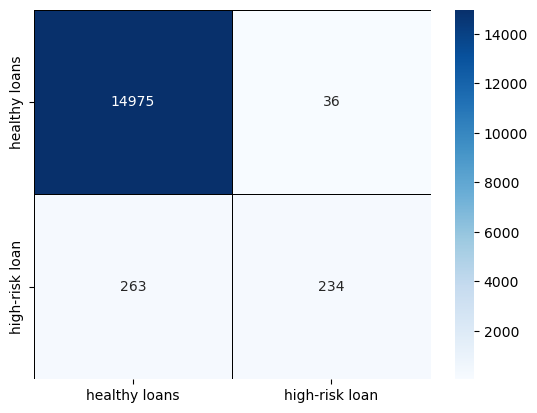

In [34]:
# Adding classes names for better interpretation
classes_names = ['healthy loans','high-risk loan']
cm = pd.DataFrame(confusion_matrix(yn_test, yn_pred_int), 
                  columns=classes_names, index = classes_names)
                  
# Seaborn's heatmap to better visualize the confusion matrix
sns.heatmap(cm, annot = True, fmt = 'd', cmap='Blues', linewidth =.5, linecolor = 'black');
# Print the balanced_accuracy score of the classifier model
print('\nbalanced accuracy score:', balanced_accuracy_score(yn_test, yn_pred_int))
# Print the classification report for the model
new_supp_lend_report = classification_report_imbalanced(yn_test, yn_pred_int)
print(new_supp_lend_report) 

In [35]:
# Mean Absolute Error (MAE)
mae_int = mean_absolute_error(yn_test, yn_pred_int)
# print the MAE for converted value
print(f'MAE int converted: {round(mae_int, 5)}')

MAE int converted: 0.01928


### Finding the Best K for KN Regression (KNeighborsRegressor)

#### create a for loop and run models that have from 1 to X neighbors. At each interaction, calculate the MAE and plot the number of Ks along with the MAE result

In [36]:
# create an empty set called 'error'
error = []

# Calculating MAE error for K values between 1 and 39
for i in range(1, 40):
    knn = KNeighborsRegressor(n_neighbors = i)
    knn.fit(Xn_train, yn_train)
    pred_i = knn.predict(Xn_test)
    mae = mean_absolute_error(yn_test, pred_i)
    error.append(mae)

### plot the error values to find the best MAE

Text(0, 0.5, 'Mean Absolute Error')

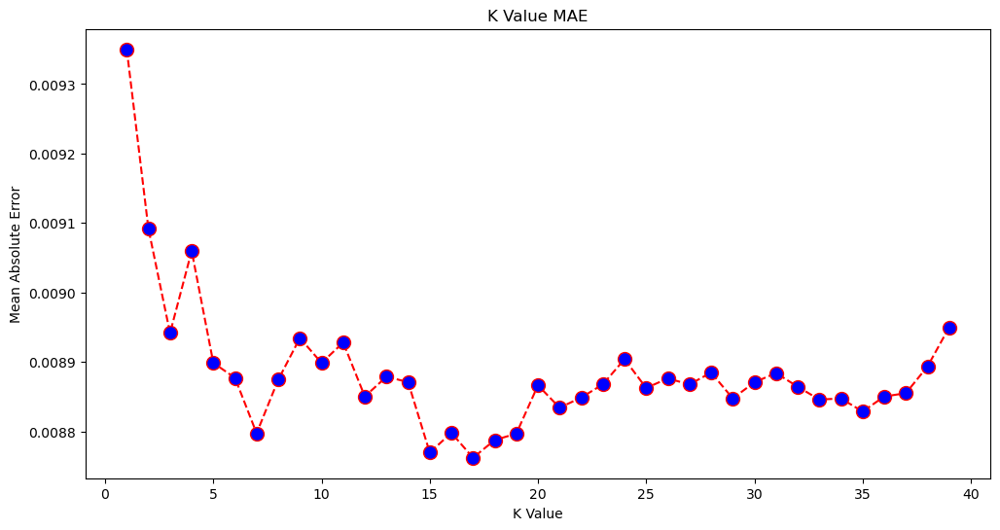

In [37]:
# plot the error
plt.figure(figsize=(12, 6))
plt.plot(range(1, 40), error, color='red', 
         linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
         
plt.title('K Value MAE')
plt.xlabel('K Value')
plt.ylabel('Mean Absolute Error')

### It appears as the lowest MAE value is when K is 17. Zoom in on the plot to be sure by plotting less data:

Text(0, 0.5, 'Mean Absolute Error')

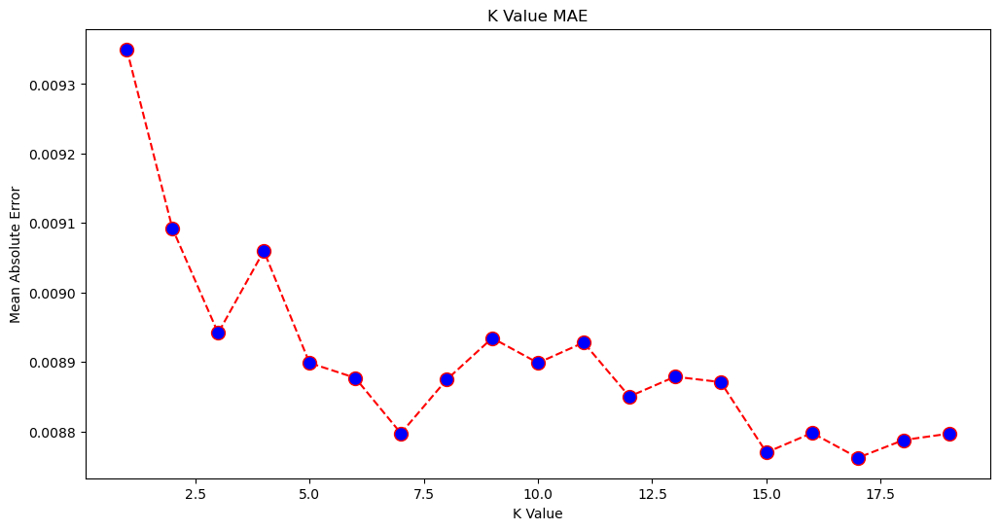

In [38]:
# New error plot, less data
plt.figure(figsize=(12, 6))
plt.plot(range(1, 20), error[:19], color='red', 
         linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('K Value MAE')
plt.xlabel('K Value')
plt.ylabel('Mean Absolute Error')

### Use NP to obtain the lowest error and the index of that point using the built-in min() function and convert the list into a NumPy array and get the argmin() -(index of the element with the lowest value)
##### Hint: started counting neighbors on 1, while arrays are 0-based, so the 16th index is 17 neighbors

In [39]:
# obtain the lowest error using the built-in min()
print(min(error))               # 0.008762081051146278
# convert the list into a NumPy array and use argmin() to get lowest index of that point
print(np.array(error).argmin()) # 16

0.008762081051146278
16


## Re-Evaluating the Algorithm for KN Regression (KNeighborsRegressor)
### Training and Predicting with n_neighbors = 17 to compare results

In [40]:
# Instantiate KN Regression with n_neighbors = 17
knn17 = KNeighborsRegressor(n_neighbors = 17)
knn17.fit(Xn_train, yn_train)

KNeighborsRegressor(n_neighbors=17)

### Make KN Regression (KNeighborsRegressor) predictions

In [41]:
# make KN Regression predictions
yn_pred17 = knn17.predict(Xn_test)
type(yn_pred17)

numpy.ndarray

## Evaluate KN Regression (KNeighborsRegressor)
#### Re-Execute metrics with n_neighbors = 17 and compare results

In [42]:
# Mean Absolute Error (MAE) and regressor score (R2)
mae_17 = mean_absolute_error(yn_test, yn_pred17)
R2_17 = knn17.score(Xn_test, yn_test) 


# print the MAE and R2 comparison with previous metrics

print(f'MAE for n_neighbors = 5: {round(mae, 5)}',
      f'versus n_neighbors = 17: {round(mae_17, 5)}\n',
      'note, lower value is better\n',
      f'\nRegressor R2 for n_neighbors = 5: {round(R2, 3)}',
      f'versus n_neighbors = 17: {round(R2_17, 3)}\n',
      'note, value closest to 1.0 is better')

MAE for n_neighbors = 5: 0.00895 versus n_neighbors = 17: 0.00876
 note, lower value is better
 
Regressor R2 for n_neighbors = 5: 0.828 versus n_neighbors = 17: 0.854
 note, value closest to 1.0 is better


In [43]:
# Transform/convert KN Regression predictions for confusion matrix compatibity - 
yn_pred17_int = np.array(yn_pred17, dtype=np.int64)            #via stratis gavnoudis
type(yn_pred17_int)

numpy.ndarray

In [44]:
# Generate a confusion matrix for the model
yn17_matrix = confusion_matrix(yn_test, yn_pred17_int)
# Print the confusion matrix for the original test data
print(yn17_matrix)

[[15005     6]
 [  467    30]]



balanced accuracy score: 0.5299812330783046
                   pre       rec       spe        f1       geo       iba       sup

          0       0.97      1.00      0.06      0.98      0.25      0.07     15011
          1       0.83      0.06      1.00      0.11      0.25      0.05       497

avg / total       0.97      0.97      0.09      0.96      0.25      0.07     15508



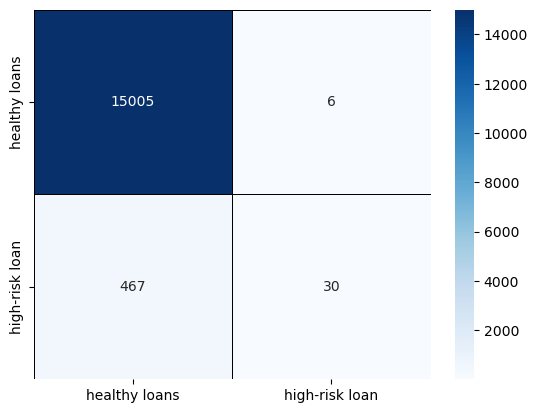

In [45]:
# Adding classes names for better interpretation
classes_names = ['healthy loans','high-risk loan']
cm = pd.DataFrame(confusion_matrix(yn_test, yn_pred17_int), 
                  columns=classes_names, index = classes_names)
                  
# Seaborn's heatmap to better visualize the confusion matrix
sns.heatmap(cm, annot = True, fmt = 'd', cmap='Blues', linewidth =.5, linecolor = 'black');
# Print the balanced_accuracy score of the classifier model
print('\nbalanced accuracy score:', balanced_accuracy_score(yn_test, yn_pred17_int))
# Print the classification report for the model
neo_supp_lend_report = classification_report_imbalanced(yn_test, yn_pred17_int)
print(neo_supp_lend_report) 

In [46]:
# Mean Absolute Error (MAE)
mae_int_17 = mean_absolute_error(yn_test, yn_pred17_int)
# print the MAE for converted value
print(f'MAE int converted: {round(mae_int_17, 5)}')

MAE int converted: 0.0305


### plot the accuracy values to find the best K

In [47]:
# create an empty set called 'accuracy_rate'
accuracy_rate = []

# Will take some time
for i in range(1,40):
    
    knn = KNeighborsRegressor(n_neighbors=i)
    score=cross_val_score(knn,Xn,yn,cv=10,scoring="neg_mean_squared_error")
    accuracy_rate.append(score.mean())

Text(0, 0.5, 'Accuracy Rate')

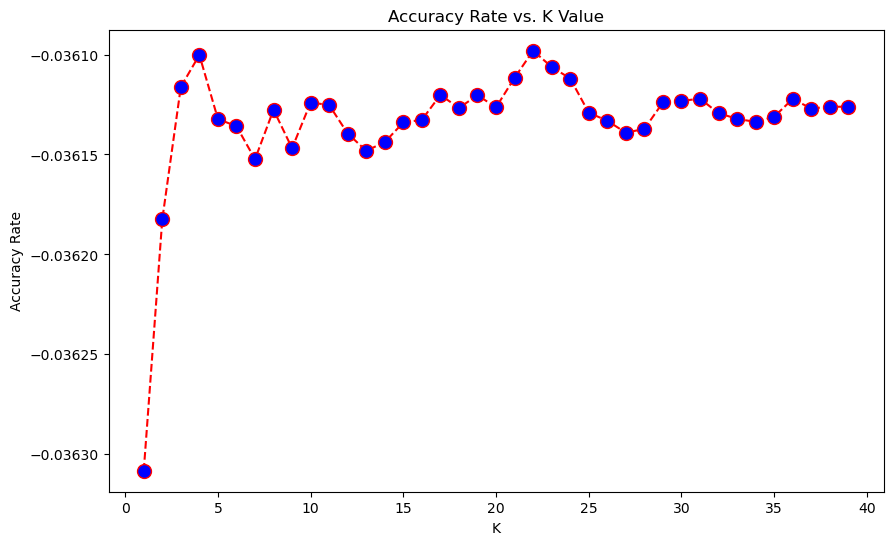

In [48]:
# plot the accuracy
plt.figure(figsize=(10,6))
plt.plot(range(1,40),accuracy_rate,color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Accuracy Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Accuracy Rate')

### Use NP to obtain the highest accuracy and the index of that point using the built-in max() function and convert the list into a NumPy array and get the argmax() -(index of the element with the highest value)
##### Hint: started counting neighbors on 1, while arrays are 0-based, so the 21st index is 22nd neighbor

In [49]:
# obtain the max accuracy using the built-in max()
print(max(accuracy_rate))               # -0.03609810816611725
# convert the list into a NumPy array and use argmin() to get lowest index of that point
print(np.array(accuracy_rate).argmax()) # 21

-0.03609810816611725
21


## Re-Evaluate the Algorithm for KN Regression (KNeighborsRegressor)
### Training and Predicting with n_neighbors = 22 to compare results

In [50]:
# Instantiate KN Regression with n_neighbors = 22
knn22 = KNeighborsRegressor(n_neighbors = 22)
knn22.fit(Xn_train, yn_train)

KNeighborsRegressor(n_neighbors=22)

### Make KN Regression (KNeighborsRegressor) predictions

In [51]:
# make KN Regression predictions
yn_pred22 = knn22.predict(Xn_test)
type(yn_pred22)

numpy.ndarray

In [52]:
# Transform/convert KN Regression predictions for confusion matrix compatibity - 
yn_pred22_int = np.array(yn_pred22, dtype=np.int64)            #via stratis gavnoudis
type(yn_pred22_int)

numpy.ndarray

In [53]:
# Generate a confusion matrix for the model
yn22_matrix = confusion_matrix(yn_test, yn_pred22_int)
# Print the confusion matrix for the original test data
print(yn22_matrix)

[[15007     4]
 [  476    21]]



balanced accuracy score: 0.5209935249361736
                   pre       rec       spe        f1       geo       iba       sup

          0       0.97      1.00      0.04      0.98      0.21      0.05     15011
          1       0.84      0.04      1.00      0.08      0.21      0.04       497

avg / total       0.97      0.97      0.07      0.96      0.21      0.05     15508



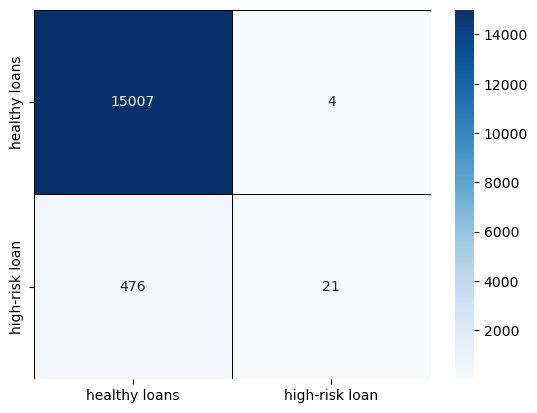

In [54]:
# Adding classes names for better interpretation
classes_names = ['healthy loans','high-risk loan']
cm = pd.DataFrame(confusion_matrix(yn_test, yn_pred22_int), 
                  columns=classes_names, index = classes_names)
                  
# Seaborn's heatmap to better visualize the confusion matrix
sns.heatmap(cm, annot = True, fmt = 'd', cmap='Blues', linewidth =.5, linecolor = 'black');
# Print the balanced_accuracy score of the classifier model
print('\nbalanced accuracy score:', balanced_accuracy_score(yn_test, yn_pred22_int))
# Print the classification report for the model
new_neo_supp_lend_report = classification_report_imbalanced(yn_test, yn_pred22_int)
print(new_neo_supp_lend_report) 

In [55]:
# Mean Absolute Error (MAE)
mae_int_22 = mean_absolute_error(yn_test, yn_pred22_int)
# print the MAE for converted value
print(f'MAE int converted: {round(mae_int_22, 5)}')

MAE int converted: 0.03095


___

### Classification using KNeighborsClassifier on original data

In [56]:
# copy and save the original dataframe
neo_supp_lend_df = supp_lend_df.copy()
# sample the DataFrame
display(neo_supp_lend_df.sample())

,loan_size,interest_rate,borrower_income,debt_to_income,num_of_accounts,derogatory_marks,total_debt,loan_status
57915,8600.0,6.786,44500,0.325843,3,0,14500,0


In [57]:
# confirm 'keys'
display(neo_supp_lend_df.columns)

Index(['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income',
       'num_of_accounts', 'derogatory_marks', 'total_debt', 'loan_status'],
      dtype='object')

### Preprocess Data for Classification
### Create the labels set (ynn) from the “loan_status” column, and then create the features (Xnn) DataFrame from the remaining columns.

In [58]:
# Separate the data into labels and features

# Separate the y variable, the labels
ynn = neo_supp_lend_df['loan_status']

# Separate the Xnn variable, the features
Xnn = neo_supp_lend_df.drop(columns = 'loan_status')
# Xnn = borrowers_df.drop('loan_status', axis=1)
# Xnn = borrowers_df[['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income', 'num_of_accounts', 'derogatory_marks', 'total_debt']]

### Split the original data into training and testing datasets by using train_test_split.

In [59]:
# Split the data using train_test_split
# Assign a random_state of 42 to the function

Xnn_train, Xnn_test, ynn_train, ynn_test = train_test_split(
    Xnn, ynn, 
    test_size=0.2,               # 80% train : 20% test split 
    random_state = SEED
)

### Feature Scaling for Classification

In [60]:
# Instantiate scaler
scaler = StandardScaler()
# Fit only on Xnn_train
# scaler.fit(Xnn_train)
Xnn_train = scaler.fit_transform(Xnn_train)
# Scale Xnn_test
Xnn_test = scaler.transform(Xnn_test)

### Training and Predicting for Classification

In [61]:
# Instantiate KNN
classifier = KNeighborsClassifier()
# fit or 'train' KNN
classifier.fit(Xnn_train, ynn_train)

KNeighborsClassifier()

### predict the data classes 

In [62]:
# make KNN classification predictions
ynn_pred = classifier.predict(Xnn_test)
type(ynn_pred)

numpy.ndarray

In [63]:
type(ynn_test)

pandas.core.series.Series

### Evaluate KNeighborsClassifier for Classification

In [64]:
# Generate a confusion matrix for the model
ynn_matrix = confusion_matrix(ynn_test, ynn_pred)

# Print the confusion matrix for the original test data
print(ynn_matrix)

[[14939    72]
 [   21   476]]



balanced accuracy score: 0.9764749981468988
                   pre       rec       spe        f1       geo       iba       sup

          0       1.00      1.00      0.96      1.00      0.98      0.96     15011
          1       0.87      0.96      1.00      0.91      0.98      0.95       497

avg / total       0.99      0.99      0.96      0.99      0.98      0.96     15508



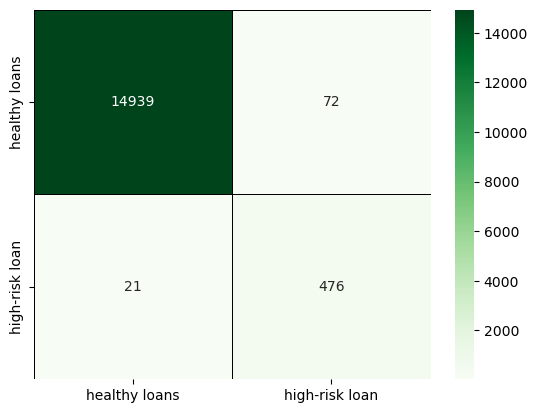

In [65]:
# Adding classes names for better interpretation
classes_names = ['healthy loans','high-risk loan']
cm = pd.DataFrame(confusion_matrix(ynn_test, ynn_pred), 
                  columns=classes_names, index = classes_names)
                  
# Seaborn's heatmap to better visualize the confusion matrix
sns.heatmap(cm, annot = True, fmt = 'd', cmap='Greens', linewidth =.5, linecolor = 'black');
# Print the balanced_accuracy score of the classifier model
print('\nbalanced accuracy score:', balanced_accuracy_score(ynn_test, ynn_pred))
# Print the classification report for the model
neo_supp_lend_report = classification_report_imbalanced(ynn_test, ynn_pred)
print(neo_supp_lend_report) 

### Finding the Best K for KNN Classification
#### create a for loop and run models that have from 1 to X neighbors. At each interaction, calculate the f1 and plot the number of Ks along with the f1 result

In [66]:
# create an empty set called 'f1s'
f1s = []

# Calculating f1 score for K values between 1 and 40
for i in range(1, 40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(Xnn_train, ynn_train)
    pred_i = knn.predict(Xnn_test)
    # using average = 'weighted' to calculate a weighted average for the classes 
    f1s.append(f1_score(ynn_test, pred_i, average='weighted'))

### plot the f1 values to find the best K

Text(0, 0.5, 'F1 Score')

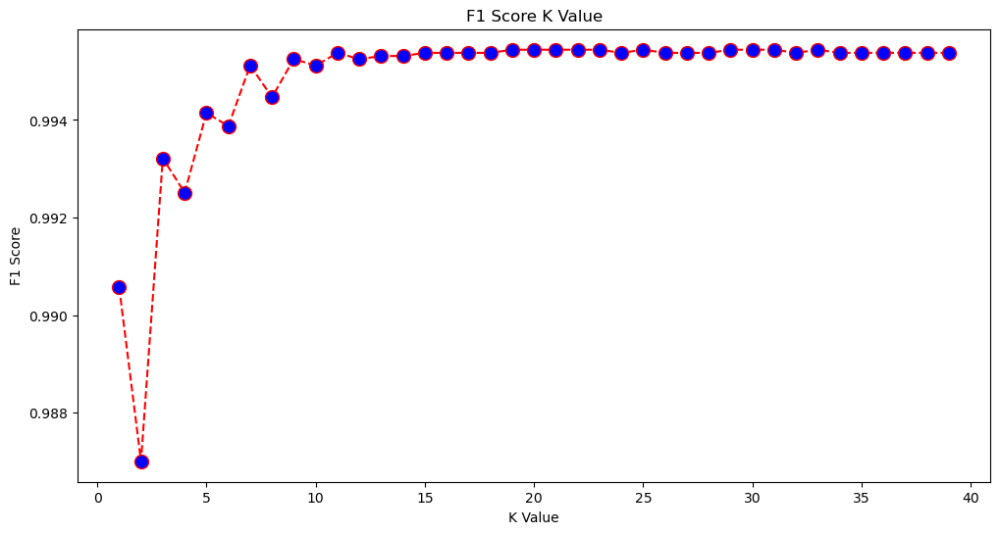

In [67]:
# plot the f1s
plt.figure(figsize=(12, 6))
plt.plot(range(1, 40), f1s, color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize = 10)
plt.title('F1 Score K Value')
plt.xlabel('K Value')
plt.ylabel('F1 Score')

### It appears as the highest f1 value is when K is 19. Zoom in on the plot to be sure by plotting less data:

Text(0, 0.5, 'F1 Score')

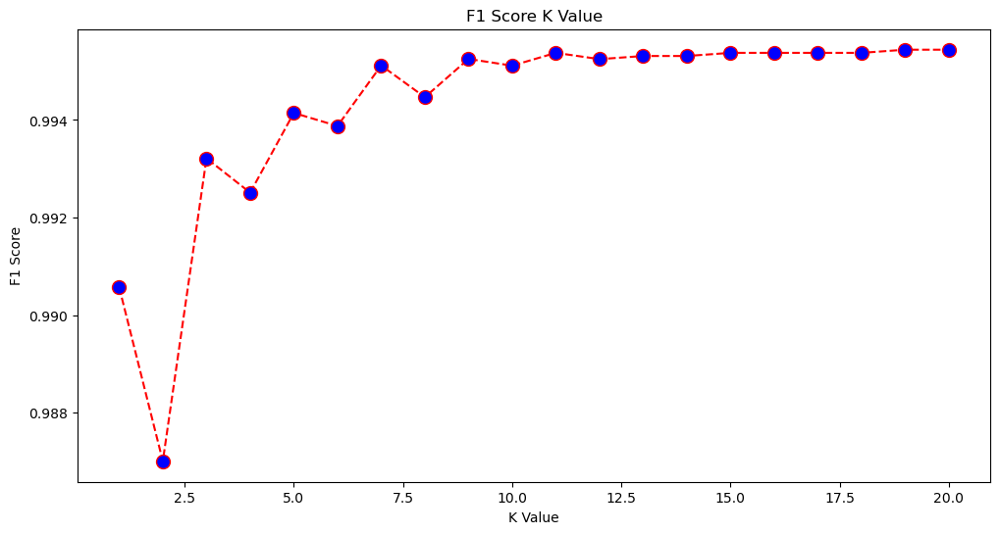

In [68]:
# New f1 plot, less data
plt.figure(figsize=(12, 6))
plt.plot(range(1, 21), f1s[:20], color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('F1 Score K Value')
plt.xlabel('K Value')
plt.ylabel('F1 Score')

### Use NP to obtain the highest f1 and the index of that point using the built-in max() function and convert the list into a NumPy array and get the argmax() (index of the element with the lowest value)
##### Hint: started counting neighbors on 1, while arrays are 0-based, so the 18th index is 19 neighbors

In [69]:
# obtain the highest f1 using the built-in max()
print(max(f1s))                       # 0.9954401055118394
# convert the list into a NumPy array and use argmax() to get highest index of that point
print(np.array(f1s).argmax())         # 18

0.9954401055118394
18


### execute the KNN classifier model and metrics again with 19 neighbors to classification report results

In [70]:
# retrain classifier with 19 neighbors 
classifier19 = KNeighborsClassifier(n_neighbors = 19)
classifier19.fit(Xnn_train, ynn_train)
ynn_pred19 = classifier19.predict(Xnn_test)

In [71]:
# Generate a confusion matrix for the classifier19 model
ynn19_matrix = confusion_matrix(ynn_test, ynn_pred19)

# Print the confusion matrix for the original test data
print(ynn19_matrix)

[[14940    71]
 [    2   495]]



balanced accuracy score: 0.9956229951824731
                   pre       rec       spe        f1       geo       iba       sup

          0       1.00      1.00      1.00      1.00      1.00      0.99     15011
          1       0.87      1.00      1.00      0.93      1.00      0.99       497

avg / total       1.00      1.00      1.00      1.00      1.00      0.99     15508



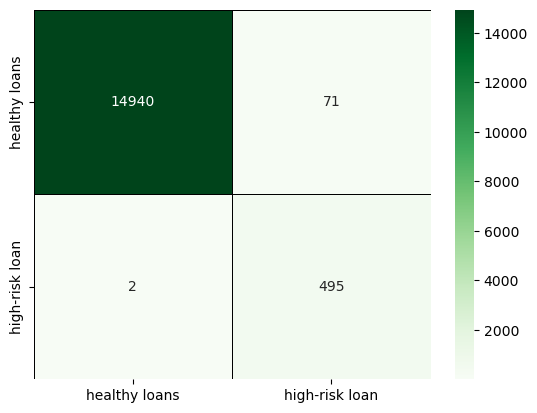

In [72]:
# Adding classes names for better interpretation
classes_names = ['healthy loans','high-risk loan']
cm = pd.DataFrame(confusion_matrix(ynn_test, ynn_pred19), 
                  columns=classes_names, index = classes_names)
                  
# Seaborn's heatmap to better visualize the confusion matrix
sns.heatmap(cm, annot = True, fmt = 'd', cmap='Greens', linewidth =.5, linecolor = 'black');
# Print the balanced_accuracy score of the classifier19 model
print('\nbalanced accuracy score:', balanced_accuracy_score(ynn_test, ynn_pred19))
# Print the classification report for the classifier19 model
neo19_supp_lend_report = classification_report_imbalanced(ynn_test, ynn_pred19)
print(neo19_supp_lend_report) 

## metrics have improved with n_neighbors = 19; accuracy is up to 99.56%, precision is the same with higher recall and f1-scores for healthy loans (1).

___

# Random Resampling

In [73]:
# copy and save the original dataframe
z1_supp_lend_df = supp_lend_df.copy()
# sample the DataFrame
display(z1_supp_lend_df.sample())

,loan_size,interest_rate,borrower_income,debt_to_income,num_of_accounts,derogatory_marks,total_debt,loan_status
23556,9300.0,7.068,47100,0.363057,3,0,17100,0


In [74]:
# confirm 'keys'
display(z1_supp_lend_df.columns)

Index(['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income',
       'num_of_accounts', 'derogatory_marks', 'total_debt', 'loan_status'],
      dtype='object')

### Preprocess Data for Classification
### Create the labels set (yz1) from the “loan_status” column, and then create the features (Xz1) DataFrame from the remaining columns.

In [75]:
# Separate the data into labels and features

# Separate the y variable, the labels
yz1 = z1_supp_lend_df['loan_status']

# Separate the X variable, the features
Xz1 = z1_supp_lend_df.drop(columns = 'loan_status')
# X = borrowers_df.drop('loan_status', axis=1)
# X = borrowers_df[['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income', 'num_of_accounts', 'derogatory_marks', 'total_debt']]

In [76]:
# Count how many targets category
z1_supp_lend_df['loan_status'].value_counts()

0    75036
1     2500
Name: loan_status, dtype: int64

### Split the original data into training and testing datasets by using train_test_split.

In [77]:
# Split the data using train_test_split
# Assign a random_state of 42 to the function

Xz1_train, Xz1_test, yz1_train, yz1_test = train_test_split(
    Xz1, yz1, 
    test_size=0.2,               # 80% train : 20% test split 
    random_state = SEED
)

### inspect datasets' lengths, i.e. review the split

In [78]:
# inspect the lengths of the full dataset and of split data
display(len(Xz1))            # 77536
display(len(Xz1_train))      # 62028
display(len(Xz1_test))       # 15508

77536

62028

15508

In [79]:
# Count distinct values
yz1_train.value_counts()

0    60025
1     2003
Name: loan_status, dtype: int64

## Random Undersampling

In [80]:
# Instantiate the RandomUnderSampler instance
rus = RandomUnderSampler(random_state = SEED)

# Fit the data to the model
Xz1_resampled, yz1_resampled = rus.fit_resample(Xz1_train, yz1_train)

In [81]:
# Re-count distinct values
yz1_resampled.value_counts()

0    2003
1    2003
Name: loan_status, dtype: int64

### Random Forest Classifier

### Training and Predicting for Classification

In [82]:
# Instantiate an initial RamdonForestClassifier instance
z1model = RandomForestClassifier(random_state = SEED)

# Fit the initial model based the training data
z1model.fit(Xz1_train, yz1_train)

RandomForestClassifier(random_state=42)

In [83]:
# Instantiate a second RamdonForestClassifier instance
z1model_resampled = RandomForestClassifier(random_state = SEED)

# Fit the second model based the resampled data
z1model_resampled.fit(Xz1_resampled, yz1_resampled)

RandomForestClassifier(random_state=42)

### predict the data classes 

In [84]:
# Make predictions using the initial model
yz1_pred = z1model.predict(Xz1_test)

# Make predictions using the model based on the resampled data
yz1_pred_resampled = z1model_resampled.predict(Xz1_test)

### Evaluate Random Forest Classifier

In [85]:
# Generate a confusion matrix for the initial model
yz1_matrix = confusion_matrix(yz1_test, yz1_pred)

# Print the confusion matrix for the original test data
print(yz1_matrix)

[[14945    66]
 [   49   448]]



balanced accuracy score: 0.9485058375032018
                   pre       rec       spe        f1       geo       iba       sup

          0       1.00      1.00      0.90      1.00      0.95      0.91     15011
          1       0.87      0.90      1.00      0.89      0.95      0.89       497

avg / total       0.99      0.99      0.90      0.99      0.95      0.91     15508



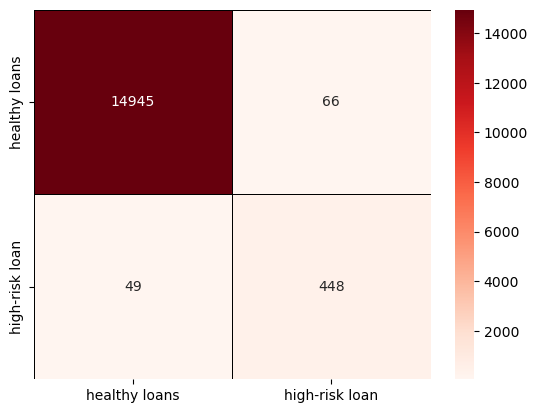

In [86]:
# Adding classes names for better interpretation
classes_names = ['healthy loans','high-risk loan']
cm = pd.DataFrame(confusion_matrix(yz1_test, yz1_pred), 
                  columns=classes_names, index = classes_names)
                  
# Seaborn's heatmap to better visualize the confusion matrix
sns.heatmap(cm, annot = True, fmt = 'd', cmap='Reds', linewidth =.5, linecolor = 'black');
# Print the balanced_accuracy score of the classifier19 model
print('\nbalanced accuracy score:', balanced_accuracy_score(yz1_test, yz1_pred))
# Print the classification report for the classifier19 model
z1_supp_lend_df_report = classification_report_imbalanced(yz1_test, yz1_pred)
print(z1_supp_lend_df_report) 

In [87]:
# Generate a confusion matrix for the resampled model
yz1_resampled_matrix = confusion_matrix(yz1_test, yz1_pred_resampled)

# Print the confusion matrix for the original test data
print(yz1_resampled_matrix)

[[14883   128]
 [    6   491]]



balanced accuracy score: 0.9897002426255622
                   pre       rec       spe        f1       geo       iba       sup

          0       1.00      0.99      0.99      1.00      0.99      0.98     15011
          1       0.79      0.99      0.99      0.88      0.99      0.98       497

avg / total       0.99      0.99      0.99      0.99      0.99      0.98     15508



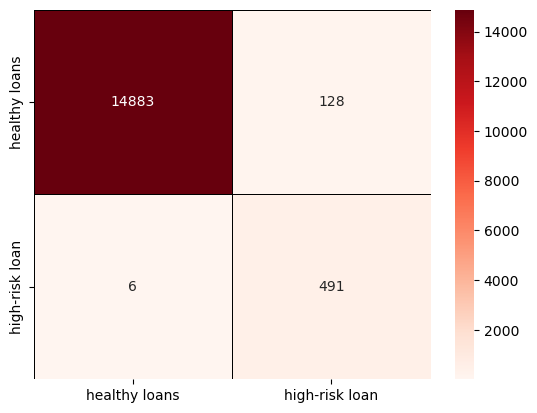

In [88]:
# Adding classes names for better interpretation
classes_names = ['healthy loans','high-risk loan']
cm = pd.DataFrame(confusion_matrix(yz1_test, yz1_pred_resampled), 
                  columns=classes_names, index = classes_names)
                  
# Seaborn's heatmap to better visualize the confusion matrix
sns.heatmap(cm, annot = True, fmt = 'd', cmap='Reds', linewidth =.5, linecolor = 'black');
# Print the balanced_accuracy score of the classifier19 model
print('\nbalanced accuracy score:', balanced_accuracy_score(yz1_test, yz1_pred_resampled))
# Print the classification report for the classifier19 model
z1_supp_lend_df_resampled_report = classification_report_imbalanced(yz1_test,  yz1_pred_resampled)
print(z1_supp_lend_df_resampled_report) 

___

## Random Oversampling

In [89]:
# Count original data distinct values
yz1_train.value_counts()

0    60025
1     2003
Name: loan_status, dtype: int64

In [90]:
# Instantiate the RandomOverSampler instance
random_oversampler = RandomOverSampler(random_state = SEED)

# Fit the data to the model
Xz1_oresampled, yz1_oresampled = random_oversampler.fit_resample(Xz1_train, yz1_train)

In [91]:
# Re-count distinct values again
yz1_oresampled.value_counts()

0    60025
1    60025
Name: loan_status, dtype: int64

### Training and Predicting for Classification

In [92]:
# Create a RandomForestClassifier instance and fit it to the original data
z1model = RandomForestClassifier(random_state = SEED)
z1model.fit(Xz1_train, yz1_train)

# Create a RandomForestClassifier instance and fit it to the resampled data
z1model_oresampled = RandomForestClassifier(random_state = SEED)
z1model_oresampled.fit(Xz1_oresampled, yz1_oresampled)

RandomForestClassifier(random_state=42)

### predict the data classes 

In [93]:
# Make predictions using the initial model
yz1_pred = z1model.predict(Xz1_test)

# Make predictions using the model based on the resampled data
yz1_pred_oresampled = z1model_oresampled.predict(Xz1_test)

### Evaluate Random Forest Classifier - Oversampled data

In [94]:
# Generate a confusion matrix for the Oversampled model
yz1_oresampled_matrix = confusion_matrix(yz1_test, yz1_pred_oresampled)

# Print the confusion matrix for the original test data
print(yz1_oresampled_matrix)

[[14930    81]
 [   37   460]]



balanced accuracy score: 0.9600786385088225
                   pre       rec       spe        f1       geo       iba       sup

          0       1.00      0.99      0.93      1.00      0.96      0.93     15011
          1       0.85      0.93      0.99      0.89      0.96      0.91       497

avg / total       0.99      0.99      0.93      0.99      0.96      0.93     15508



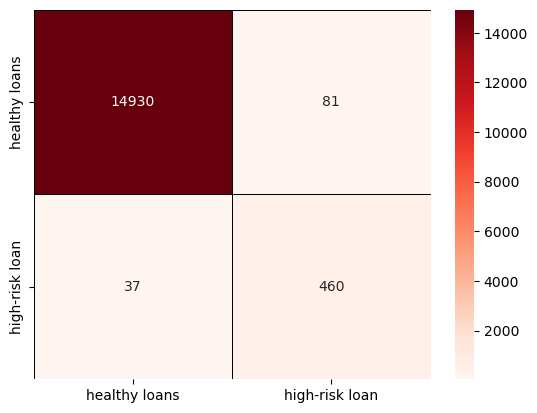

In [95]:
# Adding classes names for better interpretation
classes_names = ['healthy loans','high-risk loan']
cm = pd.DataFrame(confusion_matrix(yz1_test, yz1_pred_oresampled), 
                  columns=classes_names, index = classes_names)
                  
# Seaborn's heatmap to better visualize the confusion matrix
sns.heatmap(cm, annot = True, fmt = 'd', cmap='Reds', linewidth =.5, linecolor = 'black');
# Print the balanced_accuracy score of the classifier19 model
print('\nbalanced accuracy score:', balanced_accuracy_score(yz1_test, yz1_pred_oresampled))
# Print the classification report for the classifier19 model
z1_supp_lend_df_oresampled_report = classification_report_imbalanced(yz1_test,  yz1_pred_oresampled)
print(z1_supp_lend_df_oresampled_report) 

___

# SMOTEENN

In [96]:
# copy and save the original dataframe
z2_supp_lend_df = supp_lend_df.copy()
# confirm 'keys'
display(z2_supp_lend_df.columns)
print('\n')
# sample the DataFrame
display(z2_supp_lend_df.sample())

Index(['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income',
       'num_of_accounts', 'derogatory_marks', 'total_debt', 'loan_status'],
      dtype='object')

,loan_size,interest_rate,borrower_income,debt_to_income,num_of_accounts,derogatory_marks,total_debt,loan_status
832,9600.0,7.198,48300,0.378882,4,0,18300,0


### Preprocess Data for Classification
### Create the labels set (yz2) from the “loan_status” column, and then create the features (Xz2) DataFrame from the remaining columns.

In [97]:
# Separate the data into labels and features

# Separate the y variable, the labels
yz2 = z2_supp_lend_df['loan_status']

# Separate the X variable, the features
Xz2 = z2_supp_lend_df.drop(columns = 'loan_status')
# X = borrowers_df.drop('loan_status', axis=1)
# X = borrowers_df[['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income', 'num_of_accounts', 'derogatory_marks', 'total_debt']]

In [98]:
# Count how many targets category
z2_supp_lend_df['loan_status'].value_counts()

0    75036
1     2500
Name: loan_status, dtype: int64

### Split the original data into training and testing datasets by using train_test_split.

In [99]:
# Split the data using train_test_split
# Assign a random_state of 42 to the function

Xz2_train, Xz2_test, yz2_train, yz2_test = train_test_split(
    Xz2, yz2, 
    test_size=0.2,                # 80% train : 20% test split
    random_state = SEED
)

### inspect datasets' lengths, i.e. review the split

In [100]:
# inspect the lengths of the full dataset and of split data
display(len(Xz2))            # 77536
display(len(Xz2_train))      # 62028
display(len(Xz2_test))       # 15508

77536

62028

15508

In [101]:
# Count distinct values
yz2_train.value_counts()

0    60025
1     2003
Name: loan_status, dtype: int64

### Feature Scaling for SMOTEENN

In [102]:
# Instantiate scaler
z2scaler = StandardScaler()
# Fit only on Xz2_train
# scaler.fit_transform(Xz2_train)
Xz2_train_scaled = z2scaler.fit_transform(Xz2_train)
# Scale Xz2_test
Xz2_test_scaled = scaler.transform(Xz2_test)

### reconstruct scaled dataframe

In [103]:
# Create a DataFrame with the scaled data
col_names=['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income','num_of_accounts', 'derogatory_marks', 'total_debt']
z2_scaled_df = pd.DataFrame(Xz2_train_scaled, columns = col_names)
display(z2_scaled_df.sample(3))

,loan_size,interest_rate,borrower_income,debt_to_income,num_of_accounts,derogatory_marks,total_debt
26522,4.052013,4.035135,4.028726,3.208567,3.761779,2.760141,4.028726
39921,-0.718871,-0.698168,-0.695086,-0.843034,-0.434414,-0.672045,-0.695086
53629,0.569268,0.574974,0.581298,0.836528,0.614634,1.044048,0.581298


### SMOTEENN

In [104]:
# Instantiate the SMOTEENN instance
smote_enn = SMOTEENN(random_state = SEED)

### Fit the SMOTEENN model to the scaled training data.

In [105]:
# Fit the model to the training data
Xz2_resampled, yz2_resampled = smote_enn.fit_resample(Xz2_train_scaled, yz2_train)

### Check the value_counts for the resampled target.

In [106]:
# Count distinct values for the resampled target data
yz2_resampled.value_counts()

0    59668
1    58288
Name: loan_status, dtype: int64

### Create and fit a RandomForestClassifier to the resampled training data.

In [107]:
# Instantiate a new RandomForestClassier model
smoteenn_model = RandomForestClassifier(random_state = SEED)

# Fit the resampled data the new model
smoteenn_model.fit(Xz2_resampled, yz2_resampled)

RandomForestClassifier(random_state=42)

### Make predictions using the scaled testing data.

In [108]:
# Predict labels for resampled testing features
smoteenn_yz2_pred = smoteenn_model.predict(Xz2_test_scaled)

### Evaluate Random Forest Classifier - SMOTEENN resampled data

In [109]:
# Generate a confusion matrix for the Oversampled model
yz2_smoteenn_matrix = confusion_matrix(yz2_test, smoteenn_yz2_pred)

# Print the confusion matrix for the original test data
print(yz2_smoteenn_matrix)

[[14939    72]
 [    4   493]]



balanced accuracy score: 0.9935776138410638
                   pre       rec       spe        f1       geo       iba       sup

          0       1.00      1.00      0.99      1.00      0.99      0.99     15011
          1       0.87      0.99      1.00      0.93      0.99      0.99       497

avg / total       1.00      1.00      0.99      1.00      0.99      0.99     15508



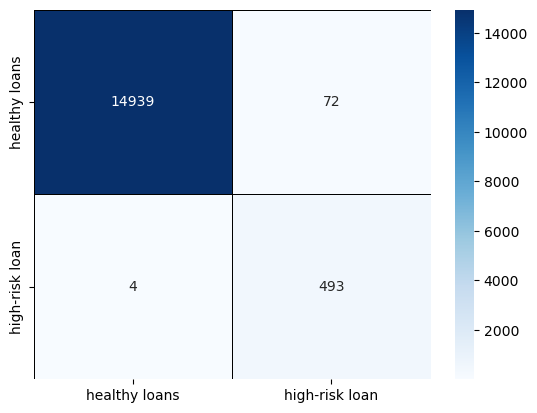

In [110]:
# Adding classes names for better interpretation
classes_names = ['healthy loans','high-risk loan']
cm = pd.DataFrame(confusion_matrix(yz2_test, smoteenn_yz2_pred), 
                  columns=classes_names, index = classes_names)
                  
# Seaborn's heatmap to better visualize the confusion matrix
sns.heatmap(cm, annot = True, fmt = 'd', cmap='Blues', linewidth =.5, linecolor = 'black');
# Print the balanced_accuracy score of the classifier19 model
print('\nbalanced accuracy score:', balanced_accuracy_score(yz2_test, smoteenn_yz2_pred))
# Print the classification report for the classifier19 model
z2_supp_lend_df_smoteenn_report = classification_report_imbalanced(yz2_test, smoteenn_yz2_pred)
print(z2_supp_lend_df_smoteenn_report) 

___

# Formal Module 12 Challenge Begins Below

______

## Split the Data into Training and Testing Sets

### Step 1: Read the `lending_data.csv` data from the `Resources` folder into a Pandas DataFrame.

In [111]:
# Read the CSV file from the Resources folder into a Pandas DataFrame
borrowers_df = rcsv(
    Path('./Resources/lending_data.csv')
)

# confirm 'keys' and review the DataFrame
display(borrowers_df.columns)
print('\n')
display(borrowers_df.shape)
print('\n')
display(borrowers_df.info())
print('\n')
display(borrowers_df.head(3))

Index(['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income',
       'num_of_accounts', 'derogatory_marks', 'total_debt', 'loan_status'],
      dtype='object')

(77536, 8)



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77536 entries, 0 to 77535
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   loan_size         77536 non-null  float64
 1   interest_rate     77536 non-null  float64
 2   borrower_income   77536 non-null  int64  
 3   debt_to_income    77536 non-null  float64
 4   num_of_accounts   77536 non-null  int64  
 5   derogatory_marks  77536 non-null  int64  
 6   total_debt        77536 non-null  int64  
 7   loan_status       77536 non-null  int64  
dtypes: float64(3), int64(5)
memory usage: 4.7 MB


None

,loan_size,interest_rate,borrower_income,debt_to_income,num_of_accounts,derogatory_marks,total_debt,loan_status
0,10700.0,7.672,52800,0.431818,5,1,22800,0
1,8400.0,6.692,43600,0.311927,3,0,13600,0
2,9000.0,6.963,46100,0.349241,3,0,16100,0


In [112]:
# Count how many targets category
borrowers_df['loan_status'].value_counts()

0    75036
1     2500
Name: loan_status, dtype: int64

### Step 2: Create the labels set (`y`)  from the “loan_status” column, and then create the features (`X`) DataFrame from the remaining columns.

In [113]:
# Separate the data into labels and features

# Separate the y variable, the labels
y = borrowers_df['loan_status']

# Separate the X variable, the features
X = borrowers_df.drop(columns = 'loan_status')
# X = borrowers_df.drop('loan_status', axis=1)
# X = borrowers_df[['loan_size', 'interest_rate', 'borrower_income', 'debt_to_income', 'num_of_accounts', 'derogatory_marks', 'total_debt']]

In [114]:
# Review the y variable Series
# list(y)
display(y.sample(3))

17146    0
52906    0
58772    0
Name: loan_status, dtype: int64

In [115]:
# Review the X variable DataFrame
display(X.sample(3))

,loan_size,interest_rate,borrower_income,debt_to_income,num_of_accounts,derogatory_marks,total_debt
20281,9800.0,7.295,49200,0.390244,4,0,19200
31157,8900.0,6.911,45600,0.342105,3,0,15600
41163,8800.0,6.880,45300,0.337748,3,0,15300


### Step 3: Check the balance of the labels variable (`y`) by using the `value_counts` function.

In [116]:
# Check the balance (i.e. magnitude of imbalance) of our target values
y.value_counts()

0    75036
1     2500
Name: loan_status, dtype: int64

### Step 4: Split the data into training and testing datasets by using `train_test_split`.

In [117]:
# Split the data using train_test_split
# Assign a random_state of 1 to the function
seed = 1
X_train, X_test, y_train, y_test = train_test_split(
    X, 
    y,
    test_size = 0.2,               # 80% train : 20% test split
    random_state = seed
)

### inspect datasets' lengths, i.e. review the split

In [118]:
# inspect the lengths of the full dataset and of split data
display(len(X))           # 77536
display(len(X_train))     # 62028
display(len(X_test))      # 15508

77536

62028

15508

---

## Create a Logistic Regression Model with the Original Data

###  Step 1: Fit a logistic regression model by using the training data (`X_train` and `y_train`).

In [119]:
# Instantiate the Logistic Regression model
# Assign a random_state parameter of 1 to the model
model = LogisticRegression(random_state = seed)

# Fit the model using training data
lr_original_model = model.fit(X_train, y_train)
lr_original_model

LogisticRegression(random_state=1)

### Step 2: Save the predictions on the testing data labels by using the testing feature data (`X_test`) and the fitted model.

In [120]:
# Make a prediction using the testing data
y_original_pred = lr_original_model.predict(X_test)
y_original_pred

array([0, 0, 0, ..., 0, 0, 0])

### Step 3: Evaluate the model’s performance by doing the following:

* Calculate the accuracy score of the model.

* Generate a confusion matrix.

* Print the classification report.

In [121]:
# Calculate the balanced_accuracy score of the model
original_balanced_accuracy_score = balanced_accuracy_score(y_test, y_original_pred)

In [122]:
# Generate a confusion matrix for the model
y_original_matrix = confusion_matrix(y_test, y_original_pred)

# Print the confusion matrix for the original test data
print(y_original_matrix)

[[14926    75]
 [   46   461]]


In [123]:
# Calculate the classification report for the model
original_pred_testing_report = classification_report_imbalanced(y_test, y_original_pred)


balanced accuracy score: 0.9521352751368186

                    pre       rec       spe        f1       geo       iba       sup

          0       1.00      1.00      0.91      1.00      0.95      0.91     15001
          1       0.86      0.91      1.00      0.88      0.95      0.90       507

avg / total       0.99      0.99      0.91      0.99      0.95      0.91     15508



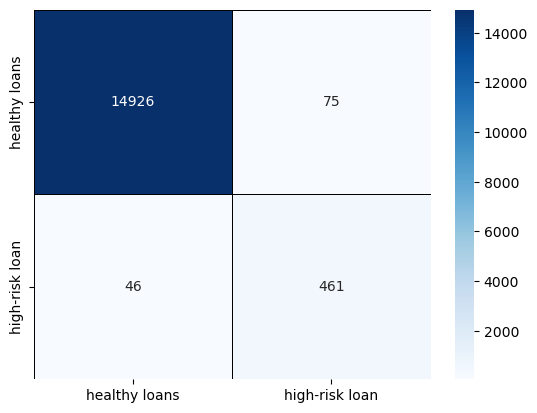

In [124]:
# Adding classes names for better interpretation
classes_names = ['healthy loans','high-risk loan']
cm = pd.DataFrame(confusion_matrix(y_test, y_original_pred), 
                  columns=classes_names, index = classes_names)
                  
# Seaborn's heatmap to better visualize the confusion matrix
sns.heatmap(cm, annot = True, fmt = 'd', cmap='Blues', linewidth =.5, linecolor = 'black');
# Print the balanced_accuracy score of the classifier19 model
print('\nbalanced accuracy score:', original_balanced_accuracy_score)
# Print the classification report for the classifier19 model
print('\n',original_pred_testing_report) 

### Step 4: Answer the following question.

**Question:** How well does the logistic regression model predict both the `0` (healthy loan) and `1` (high-risk loan) labels?

**Answer:** 
##### It might be reasonably good.  You would have to be more granular on the details as to how much is lost per 'high risk' loan vs how much profit is obtained from 'healthy' loans.  Clearly the the high risk (1) class is minority but its actual financial contribution may be multiples or exponetial in relationship to the contribution of 'healthy' loans.  Given those caveates, precision for healthy (0) is 100% and 86% for high risk (1).  Additionally, balanced accuracy score is 9521%, and recall 100% / 91% and f1 100% / 88% healthy (0) vs high risk (1).

---

## Predict a Logistic Regression Model with Resampled Training Data

### Step 1: Use the `RandomOverSampler` module from the imbalanced-learn library to resample the data. Be sure to confirm that the labels have an equal number of data points. 

In [125]:
# Instantiate the random oversampler model
# Assign a random_state parameter of 1 to the model
random_oversampler = RandomOverSampler(random_state = seed)
# Fit the original training data to the random_oversampler model
X_resampled, y_resampled = random_oversampler.fit_resample(X_train, y_train)

### Check the number of distinct values (value_counts) for the resampled labels.

In [126]:
# Count the distinct values of the resampled labels data
y_resampled.value_counts()

0    60035
1    60035
Name: loan_status, dtype: int64

### Step 2: Use the `LogisticRegression` classifier and the resampled data to fit the model and make predictions.

In [127]:
# Instantiate the Logistic Regression model
# Assign a random_state parameter of 1 to the model
model = LogisticRegression(random_state = seed)
# Fit the model using the resampled training data
lr_resampled_model = model.fit(X_resampled, y_resampled)
lr_resampled_model

LogisticRegression(random_state=1)

### Save predictions, using the logistic regression model, predict the values for the resampled sets.

In [128]:
# Predict the labels for the testing data using the resampled logistic regression model
y_resampled_pred = lr_resampled_model.predict(X_test)
y_resampled_pred

array([0, 0, 0, ..., 0, 0, 0])

### Step 3: Evaluate the model’s performance by doing the following:

* Calculate the accuracy score of the model.

* Generate a confusion matrix.

* Print the classification report.

In [129]:
# Print the balanced_accuracy score of the model 
original_resampled_balanced_accuracy_score = balanced_accuracy_score(y_test, y_resampled_pred)

In [130]:
# Generate a confusion matrix for the model
y_resampled_matrix = confusion_matrix(y_test, y_resampled_pred)

# Print the confusion matrix for the original test data
print(y_resampled_matrix)

[[14915    86]
 [    3   504]]


In [131]:
# Print the classification report for the model
resampled_pred_testing_report = classification_report_imbalanced(y_test, y_resampled_pred)


balanced accuracy score: 0.9941749445500477

                    pre       rec       spe        f1       geo       iba       sup

          0       1.00      0.99      0.99      1.00      0.99      0.99     15001
          1       0.85      0.99      0.99      0.92      0.99      0.99       507

avg / total       1.00      0.99      0.99      0.99      0.99      0.99     15508



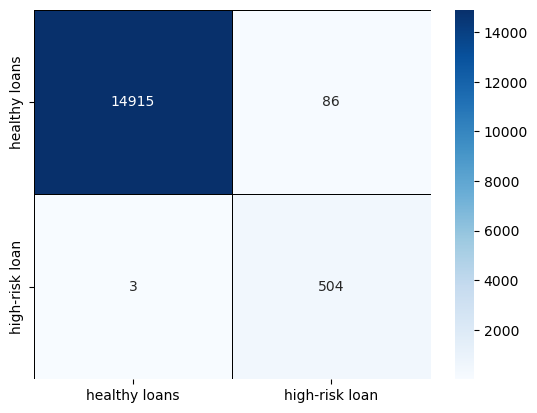

In [132]:
# Adding classes names for better interpretation
classes_names = ['healthy loans','high-risk loan']
cm = pd.DataFrame(confusion_matrix(y_test, y_resampled_pred), 
                  columns=classes_names, index = classes_names)
                  
# Seaborn's heatmap to better visualize the confusion matrix
sns.heatmap(cm, annot = True, fmt = 'd', cmap='Blues', linewidth =.5, linecolor = 'black');
# Print the balanced_accuracy score of the classifier19 model
print('\nbalanced accuracy score:', original_resampled_balanced_accuracy_score)
# Print the classification report for the classifier19 model
print('\n',resampled_pred_testing_report) 

### Step 4: Answer the following question

**Question:** How well does the logistic regression model, fit with oversampled data, predict both the `0` (healthy loan) and `1` (high-risk loan) labels?

**Answer:**
##### balanced accuracy improved from 0.9521 to 0.994, precision for high risk loans decreased slightly from 0.86 to 0.85, however the minimal decriment in precision was significantly offset with improved recall from 0.91 to 0.99 and f1 score from 0.88 to 0.92.  Looking at the heatmap/confusion matrices, this translated into a decrease in adverse labeling of high risk loans as healthy loans; from 46 down to 3!  Using the oversampling, the logistic regression model was able to better recognize the minority class (1) which was the unhealthy/'bad' loans.  Overall, this benefits were achieved with only a small loss of identification of healthy/'good' loans; i.e. 75 to 86.